# Region Displayer
___

This Jupyter Notebook is part of the time travel distance project and displays the travel time and elevation data, which got aquired in a previous step. Be sure to run the RegionMapper before running this notebook to collect needed data. In this notebook we will load the data, display the samples, create the interpolation maps for each transportation type (walking, bicycling, driving) and elevation and lastly display the difference between the transportation types travel time. 


### Import

In [2]:
from src.RegionElevatioDisplayer.regionElevationDisplayer import RegionElevationDisplayer
from src.RegionTimeDistanceDisplayer.regionTimeDistanceDisplayer import RegionTimeDistanceDisplayer

### Load
Load data from JSON files stored in the data directory for different modes of transportation. Transportation modes which are stored are bicycling, walking and driving. Additonally we load the elevation data which can also be found in the data directory. 

In [3]:
# Load Walking Object
rtddWalking = RegionTimeDistanceDisplayer(filename="/data/walking.json")

# Load Bicycling Object
rtddBicycling = RegionTimeDistanceDisplayer(filename="/data/bicycling.json")

# Load Driving Object
rtddDriving = RegionTimeDistanceDisplayer(filename="/data/driving.json")

# Load Elevation Object
elevation = RegionElevationDisplayer()

### Display Samples
The datapoints where collected in a grid fashion (for more information see tha RegionMapper notebook).We display the samples of collected data with a Folium map and show the travel time and elevation height. For the different transportation modes samples will display the travel time from the big marker in the center to the sample point, where blue means short and pink means long. For the elevation map we encode the height as color of the samples, where blue means low and pink means high. Additionally you can click on each data point to see the travel time or height.

⚠️ Be carefull if you render all maps, since there are quite a lot of data points this might slow down your computer.

#### Walking Samples

In [8]:
rtddWalking.generateMap()
rtddWalking.map.save("maps/walking.html")
rtddWalking.map

#### Bicycling Samples

In [9]:
rtddBicycling.generateMap()
rtddBicycling.map.save("maps/bicycling.html")
rtddBicycling.map

#### Driving Samples

In [11]:
rtddDriving.generateMap()
rtddDriving.map.save("maps/driving.html")
rtddDriving.map

#### Elevation Samples

In [12]:
elevation.generateMap()
elevation.map.save("maps/elevation.html")
elevation.map

### Display Interpolation Maps
While the sample representation has its charm, we also want to have an interpolated version of the map with conturs such that we can easily compare them with one another. Additionally we want to have a diffrent representation for the elevation map.

#### Interpolation Maps

/var/folders/4b/rkjcb02d7976w471m6bpyl7c0000gn/T/ipykernel_25446/1925533601.py:11: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.tight_layout()


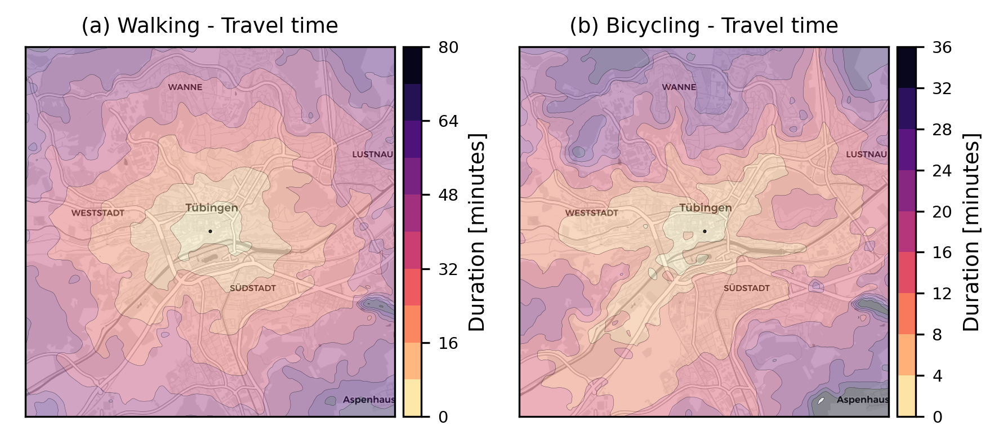

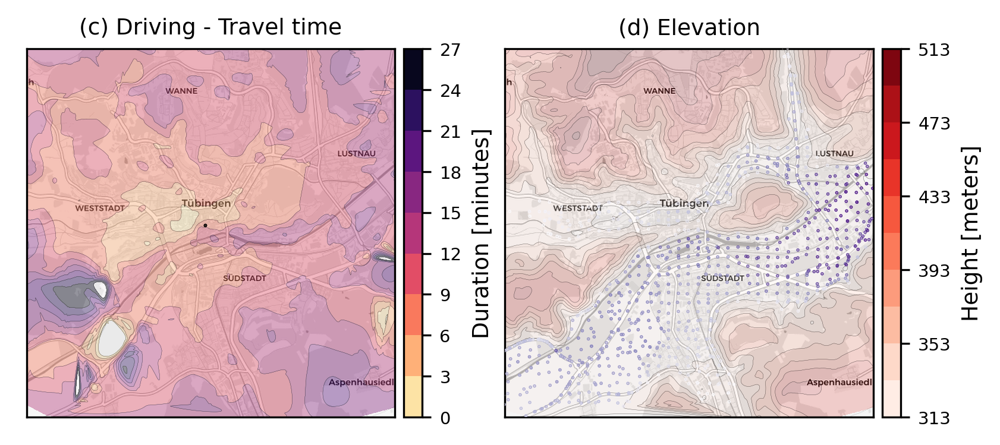

In [13]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, dpi=300)
fig.tight_layout() 

rtddWalking.generateInterpolationPlot(ax[0], title="(a) Walking - Travel time")
rtddBicycling.generateInterpolationPlot(ax[1], title="(b) Bicycling - Travel time")
fig.savefig("plots/interpolation_maps/walking_bicycling.png")

fig, ax = plt.subplots(1, 2, dpi=300)
fig.tight_layout() 

rtddDriving.generateInterpolationPlot(ax[0], title="(c) Driving - Travel time")
elevation.generateInterpolationPlot(ax[1], title="(d) Elevation")
fig.savefig("plots/interpolation_maps/driving_elevation.png")
